### Notebook for training models used in hand sign recognition

First of all importing all needed packages

In [40]:
import cv2
import numpy as np
import os
from matplotlib import pyplot as plt
import time
import mediapipe as mp

Following codeblocks are for testing purposes to see how to take a picture with the open cv library

In [41]:
def capture_image():
    # Open the default camera (index 0)
    cap = cv2.VideoCapture(0)

    # Check if the camera is opened successfully
    if not cap.isOpened():
        print("Failed to open the camera")
        return None

    # Read the image from the camera
    ret, frame = cap.read()

    # Release the camera
    cap.release()

    # Check if the image was read successfully
    if not ret:
        print("Failed to capture the image")
        return None

    # Convert the image to RGB format
    image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    return image

# Capture an image from the webcam
#image = capture_image()

#np.save('hand_image.npy', image)
#plt.imshow(image)

Now we try detect hand landmarks on this picture with the mediapipe library

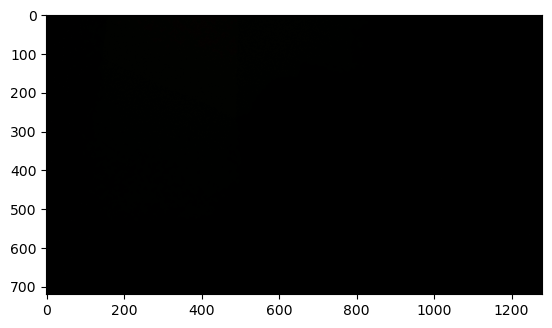

In [42]:
def detect_hand_landmarks(image):
    mp_drawing = mp.solutions.drawing_utils
    mp_hands = mp.solutions.hands

    # Load the MediaPipe Hands model
    with mp_hands.Hands(static_image_mode=False, max_num_hands=2, min_detection_confidence=0.5) as hands:
        # Convert the image to RGB format
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Process the image to detect hand landmarks
        results = hands.process(image_rgb)

        # Check if any hands were detected
        if results.multi_hand_landmarks:
            # Iterate through each detected hand
            for hand_landmarks in results.multi_hand_landmarks:
                # Draw the landmarks on the image
                mp_drawing.draw_landmarks(image, hand_landmarks, mp_hands.HAND_CONNECTIONS)

                # Extract the landmarks for each finger
                for finger_id in range(5):
                    finger_landmarks = hand_landmarks.landmark[mp_hands.HandLandmark.WRIST + (finger_id * 4):mp_hands.HandLandmark.WRIST + (finger_id * 4) + 4]

    # Return the image with landmarks drawn
    return image, results

# Load an image or capture from a camera

# Detect hand landmarks and display the result
image, results = detect_hand_landmarks(np.load('hand_image.npy'))
plt.imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

Now that we figured out how to detect handlandmarks on a picture we want to create the train and test datasets. In the assignemnt we had to benchmark a model trained on a dataset of 10 images, that's why in this function for each sign type 10 training images are taken and 5 test images. The signs learned by the model are the following:

* Rock-on
* Open-hand
* Peace
* Surf

To store the data I opted for .jpg files instead of .npy array because this is a more efficient way of storing images.


In [43]:
def capture_images_interval(interval, total_images, sign_name):
    images = []
    # Open the default camera (index 0)
    cap = cv2.VideoCapture(0)

    # Check if the camera is opened successfully
    if not cap.isOpened():
        print("Failed to open the camera")
        return

    image_count = 0

    while image_count < total_images:
        # Read the current frame from the camera
        ret, frame = cap.read()



        # Display the current frame
        cv2.putText(frame, f"{sign_name} taken: {image_count}/{total_images}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
        cv2.imshow("Camera Footage", frame)



        # Check if the image should be captured
        if time.time() % interval < 0.1:
            ret, frame = cap.read()

            # Increment the image count
            image_count += 1

            # Display the captured image
            cv2.imshow("Captured Image", frame)
            cv2.waitKey(1000)  # Display the captured image for 1 second
            images.append(frame)

        # Check for 'q' key press to exit the loop
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    # Release the camera and close all windows
    cap.release()
    cv2.destroyAllWindows()
    return images

def save_image(path, image):
    np.save(path, image)

signs = ['open-hand', 'rock-on', 'peace', 'surf']

"""
for sign in signs:
    nb_images = 15
    interval = 4

    images = capture_images_interval(interval, nb_images, sign)

    for i in range(int(nb_images * 0.7)):
        cv2.imwrite(os.path.join('images', 'train', sign,  str(i) + '.jpg'), images[i])

    for i in range(int(nb_images * 0.7), len(images)):
        cv2.imwrite(os.path.join('images', 'test', sign , str(i) + '.jpg'), images[i])
"""


"\nfor sign in signs:\n    nb_images = 15\n    interval = 4\n\n    images = capture_images_interval(interval, nb_images, sign)\n\n    for i in range(int(nb_images * 0.7)):\n        cv2.imwrite(os.path.join('images', 'train', sign,  str(i) + '.jpg'), images[i])\n\n    for i in range(int(nb_images * 0.7), len(images)):\n        cv2.imwrite(os.path.join('images', 'test', sign , str(i) + '.jpg'), images[i])\n"

Visualization of the hand landmarks on top of some of the training images. Each row is one of the classe.

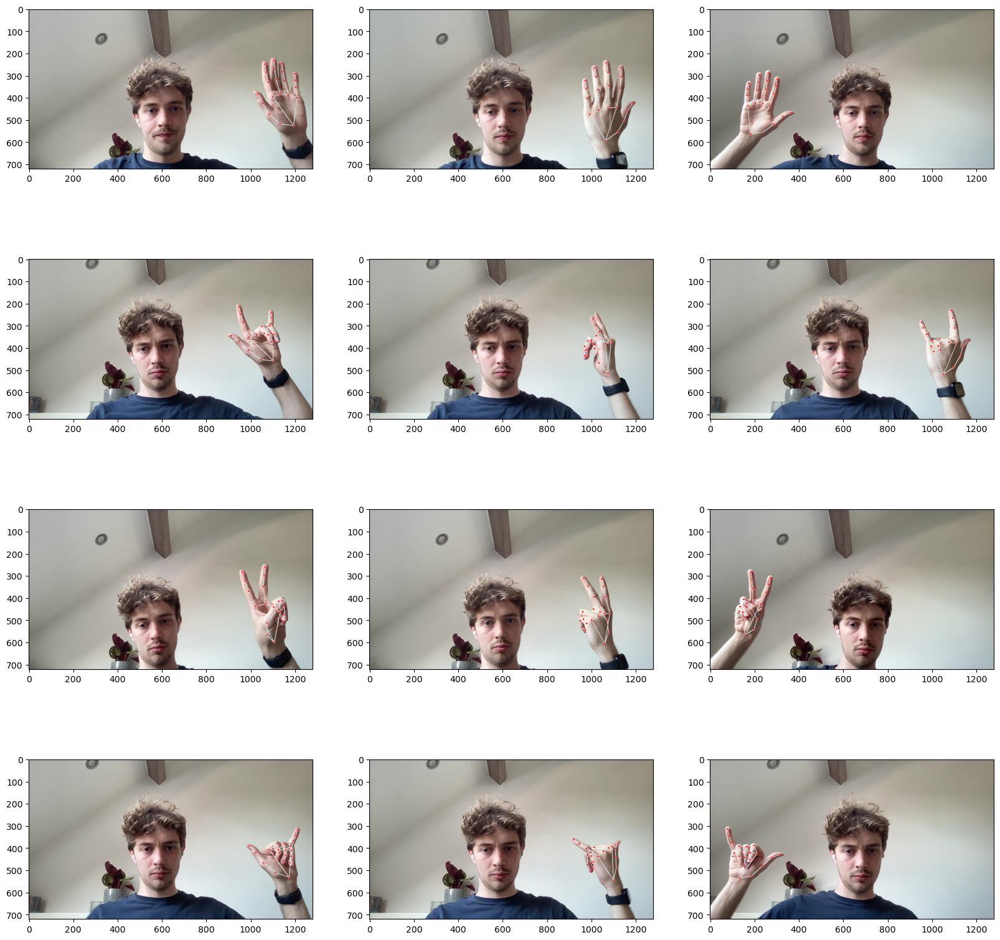

In [82]:
def read_image(path):
    return cv2.imread(path)

fig, axes = plt.subplots(len(signs),3, figsize=(20,20))

for k in range(len(signs)):
    for i in range(3):
        image = read_image(os.path.join('images', 'train', signs[k],str(i) + '.jpg'))
        image, results = detect_hand_landmarks(image)
        axes[k][i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

We only have 10 training images per sign, and we want our model to be robust. So we augment the training data to make it look like we have more then 10 images. We do this by applying following random image transformations:
* Rotation
* Change brightness
* Change contrast

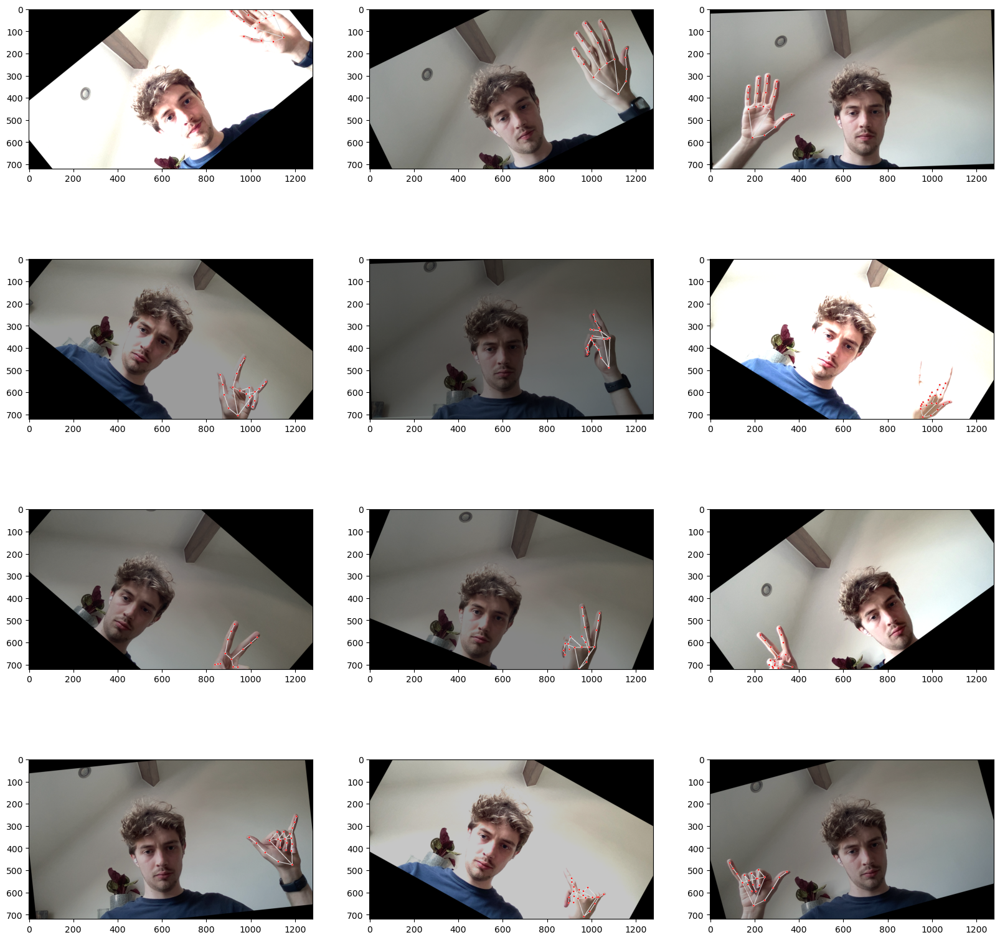

In [81]:
def random_augment(image):
    brightness_factor = np.random.uniform(0.5, 1.5)
    contrast_factor = np.random.uniform(0.5, 1.5)
    angle = np.random.randint(-45, 45)
    return augment_image(image, brightness_factor, contrast_factor, angle)

def augment_image(image, brightness_factor, contrast_factor, angle):
    rows, cols, _ = image.shape
    M = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)

    augmented_image = cv2.convertScaleAbs(image, alpha=brightness_factor)
    augmented_image = cv2.convertScaleAbs(augmented_image, alpha=contrast_factor, beta=0)
    augmented_image = cv2.warpAffine(augmented_image, M, (cols, rows))

    return augmented_image


fig, axes = plt.subplots(len(signs),3, figsize=(20,20))

for k in range(len(signs)):
    for i in range(3):
        image = read_image(os.path.join('images', 'train', signs[k], str(i) + '.jpg'))

        image, results = detect_hand_landmarks(random_augment(image))

        axes[k][i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

Function to extract landmarks values from the mediapipe output and flatten them to prepare to give to the model as input. This together is called the preprocessing.

In [46]:
def preprocess_landmarks(landmarks):
    return np.array([[point.x, point.y, point.z]for point in landmarks.multi_hand_landmarks[0].landmark]).flatten()

Here we generate random data with the image augmentation mentioned earlier

In [47]:
from random import randint
import pandas as pd
def generate_data(path, signs, amount=5):
    data = []
    for i in range(len(signs)):
        sign_data = []
        for _ in range(amount):
            

            image_paths = os.listdir(os.path.join(path, signs[i]))

            image_path = os.path.join(path, signs[i], image_paths[randint(0, len(image_paths) - 1)])


            try:
                _, landmarks = detect_hand_landmarks(random_augment(read_image(image_path)))
                landmarks = preprocess_landmarks(landmarks)
            except TypeError:
                landmarks = np.zeros(63)

            sign_data.append(landmarks)


        data.append(pd.DataFrame({'X' : sign_data, 'y': [i for _ in range(len(sign_data))]}))

    return pd.concat(data)

train_data = generate_data(os.path.join('images', 'train'), signs, amount=200)

Now we fit some machine learning models, I chose for some models I know to be good with nummerical input values. For the solution we will use the following models:
* Random forest
* Gradient boosting
* Support vector machine
* Nearest neighbours
* Logistic regression

In [48]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

models = [RandomForestClassifier(), GradientBoostingClassifier(), SVC(), KNeighborsClassifier(), LogisticRegression()]

for model in models:
    model = model.fit(np.array([entry for entry in train_data['X']]), train_data['y'])

/Users/stijn/miniconda3/envs/CV/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


We generate in the same way as the training data some test data, also with image augmentation

In [65]:
test_data = generate_data(os.path.join('images', 'test'), signs, amount=50)

Now we calculate the accuracy and f1 score of our different models on the test set. Notice that the f1 score and accuracy is always the same, this is because I generated an equal amount of test examples for each class. So f1 score is not needed here, but alas I wanted to show this because f1 is often used in multi-class classification.

In [50]:
from sklearn.metrics import f1_score, accuracy_score

highest_score = 0
best_model = None
for model in models:
    print(model)
    preds = model.predict(np.array([entry for entry in test_data['X']]))
    print('Accuracy: ' + str(accuracy_score(test_data['y'].values, preds)))

    f1 = f1_score(test_data['y'].values, preds, average='micro')
    print('F1 scores: ' + str(f1))

    if f1 > highest_score:
        highest_score = f1
        best_model = model


RandomForestClassifier()
Accuracy: 0.61
F1 scores: 0.61
GradientBoostingClassifier()
Accuracy: 0.66
F1 scores: 0.66
SVC()
Accuracy: 0.67
F1 scores: 0.67
KNeighborsClassifier()
Accuracy: 0.665
F1 scores: 0.665
LogisticRegression()
Accuracy: 0.86
F1 scores: 0.8599999999999999


Furthermore we define a predict funtion so we can put in a model and an image and we get a prediction of our model returned. We vizualize the predictions of some of the test images aswell.

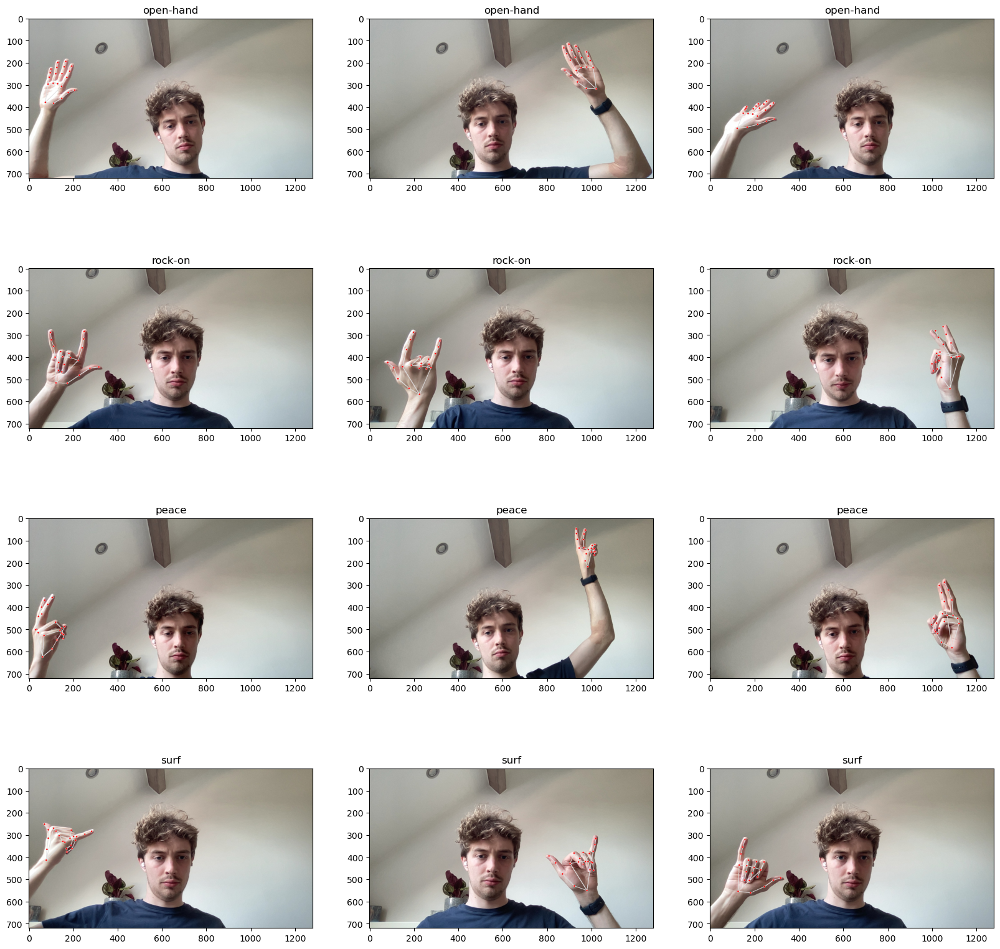

In [78]:
from random import choice
fig, axes = plt.subplots(len(signs),3, figsize=(20,20))

def predict(model, example):
    _, landmarks = detect_hand_landmarks(example)

    if landmarks.multi_hand_landmarks:
        prep_landmarks = preprocess_landmarks(landmarks)
        prediction = model.predict([prep_landmarks])[0]
    return prediction

for class_ in test_data['y'].unique():
    for i in range(3):
        folder_path = os.path.join('images', 'test', signs[class_])
        file_names = os.listdir(folder_path)
        example = read_image(os.path.join(folder_path, choice(file_names)))   
        pred = predict(best_model, example)
        axes[class_, i].imshow(cv2.cvtColor(example, cv2.COLOR_BGR2RGB))
        axes[class_, i].set_title(signs[pred])

Next we try the bonus exercise to detect hand motion. So we create a function that records clips and saves them as .mp4 files, again this instead of .npy because memory efficiency.

In [51]:
def capture_gestures_interval(interval, total_gestures, gesture_length_frames, sign_name, path):
    gestures = []
    # Open the default camera (index 0)
    cap = cv2.VideoCapture(0)

    # Check if the camera is opened successfully
    if not cap.isOpened():
        print("Failed to open the camera")
        return
    
    fourcc = cv2.VideoWriter_fourcc('M','J','P','G')
    frame_width = int(cap.get(3))
    frame_height = int(cap.get(4))
    

    gesture_count = 0

    while gesture_count < total_gestures:
        # Read the current frame from the camera
        ret, frame = cap.read()



        # Display the current frame
        cv2.putText(frame, f"{sign_name} taken: {gesture_count}/{total_gestures}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
        cv2.imshow("Camera Footage", frame)



        # Check if the image should be captured
        if time.time() % interval < 0.1:
            out = cv2.VideoWriter(os.path.join(path, sign_name, str(gesture_count) + '.mp4'), fourcc, 25, (frame_width,frame_height))
            for _ in range(gesture_length_frames):
                _, frame = cap.read()
                out.write(frame)

                cv2.putText(frame, "RECORDING", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
                cv2.imshow("Camera Footage", frame)
                
            out.release()
            gesture_count += 1

        # Check for 'q' key press to exit the loop
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    # Release the camera and close all windows
    cap.release()
    cv2.destroyAllWindows()
    return gestures

def save_image(path, image):
    np.save(path, image)

gesture_types = ['other', 'wave']

"""
for type in gesture_types:
    nb_gestures = 15
    interval = 5

    gestures = capture_gestures_interval(interval, int(nb_gestures * 0.6667), 50, type, os.path.join('gestures', 'train'))
    gestures = capture_gestures_interval(interval, int(nb_gestures * 0.3334), 50, type, os.path.join('gestures', 'test'))
"""


"\nfor type in gesture_types:\n    nb_gestures = 15\n    interval = 5\n\n    gestures = capture_gestures_interval(interval, int(nb_gestures * 0.6667), 50, type, os.path.join('gestures', 'train'))\n    gestures = capture_gestures_interval(interval, int(nb_gestures * 0.3334), 50, type, os.path.join('gestures', 'test'))\n"

We create a function to read the .mp4 files and plot the first 30 frames of the video

[ WARN:0@16927.744] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modules/videoio/src/cap_gstreamer.cpp (2386) handleMessage OpenCV | GStreamer warning: your GStreamer installation is missing a required plugin
[ WARN:0@16927.744] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modules/videoio/src/cap_gstreamer.cpp (2402) handleMessage OpenCV | GStreamer warning: Embedded video playback halted; module uridecodebin32 reported: Your GStreamer installation is missing a plug-in.
[ WARN:0@16927.744] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modules/videoio/src/cap_gstreamer.cpp (1356) open OpenCV | GStreamer warning: unable to start pipeline
[ WARN:0@16927.744] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modu

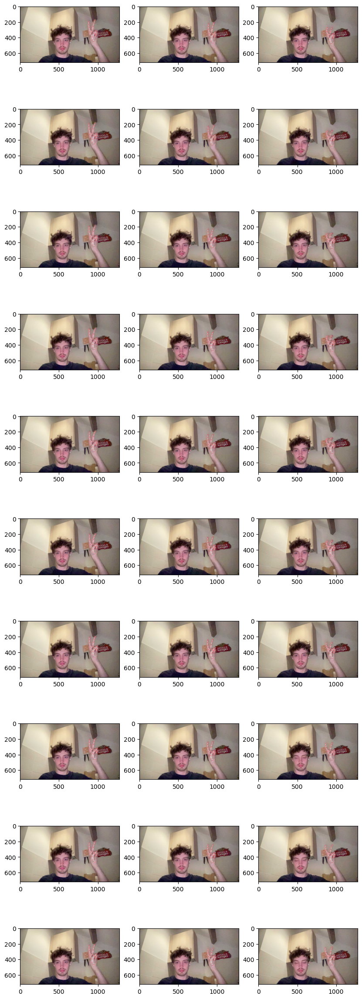

In [52]:
def read_video(path):
    cap = cv2.VideoCapture(path)
    frames = []
    while(cap.isOpened()):
        ret, frame = cap.read()
        if ret:
            frames.append(frame)
        else:
            break
    return frames

def plot_first_30_frames(frames):
    fig, axes = plt.subplots(10,3, figsize=(10,30))

    for i in range(30):
        row = i % 10
        col = i // 10
        image, results = detect_hand_landmarks(frames[i])
        axes[row, col].imshow(cv2.cvtColor(frames[i], cv2.COLOR_BGR2RGB))

plot_first_30_frames(read_video(os.path.join('gestures', 'train', 'other', '6.mp4')))

Again we only have a few videos per class, so we should augment it in the same way as with sign recognition. But now we want each frame of a video to be augmented in the same way, so we only have different augmentations between videos.

[ WARN:0@16931.905] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modules/videoio/src/cap_gstreamer.cpp (2386) handleMessage OpenCV | GStreamer warning: your GStreamer installation is missing a required plugin
[ WARN:0@16931.905] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modules/videoio/src/cap_gstreamer.cpp (2402) handleMessage OpenCV | GStreamer warning: Embedded video playback halted; module uridecodebin33 reported: Your GStreamer installation is missing a plug-in.
[ WARN:0@16931.905] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modules/videoio/src/cap_gstreamer.cpp (1356) open OpenCV | GStreamer warning: unable to start pipeline
[ WARN:0@16931.905] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modu

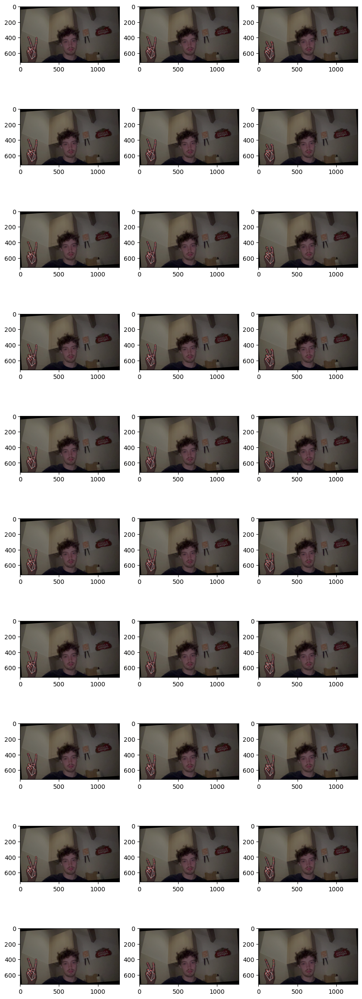

In [53]:
def random_augment_video(frames):
    brightness_factor = np.random.uniform(0.5, 1.5)
    contrast_factor = np.random.uniform(0.5, 1.5)
    angle = np.random.randint(-45, 45)
    return np.array([augment_image(image, brightness_factor, contrast_factor, angle) for image in frames])


def augment_image(image, brightness_factor, contrast_factor, angle):
    rows, cols, _ = image.shape
    M = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)

    augmented_image = cv2.convertScaleAbs(image, alpha=brightness_factor)
    augmented_image = cv2.convertScaleAbs(augmented_image, alpha=contrast_factor, beta=0)
    augmented_image = cv2.warpAffine(augmented_image, M, (cols, rows))

    return augmented_image


plot_first_30_frames(random_augment_video(read_video(os.path.join('gestures', 'train', 'other', '4.mp4'))))

Again we generate training data for the motion/gesture recognition.

In [54]:
from random import choice
import pandas as pd
def generate_gesture_data(path, gestures, amount=5):
    data = []
    for i in range(len(gestures)):
        gesture_data = []
        gesture_videos = []
        gesture_paths = os.listdir(os.path.join(path, gestures[i]))
        for gesture_path in gesture_paths:
            gesture_videos.append(read_video(os.path.join(path, gestures[i], gesture_path)))
        for _ in range(amount):
            augmented_gesture = random_augment_video(choice(gesture_videos))
            gesture_landmarks = []
            for frame in augmented_gesture:
                try:
                    _, landmarks = detect_hand_landmarks(frame)
                    landmarks = preprocess_landmarks(landmarks)
                except TypeError:
                    landmarks = np.zeros(63)
                gesture_landmarks.append(landmarks)



            gesture_data.append(np.array(gesture_landmarks))


        data.append(pd.DataFrame({'X' : gesture_data, 'y': [i for _ in range(len(gesture_data))]}))

    return pd.concat(data)

train_data = generate_gesture_data(os.path.join('gestures', 'train'), gesture_types, amount=50)

[ WARN:0@16937.128] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modules/videoio/src/cap_gstreamer.cpp (2386) handleMessage OpenCV | GStreamer warning: your GStreamer installation is missing a required plugin
[ WARN:0@16937.128] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modules/videoio/src/cap_gstreamer.cpp (2402) handleMessage OpenCV | GStreamer warning: Embedded video playback halted; module uridecodebin34 reported: Your GStreamer installation is missing a plug-in.
[ WARN:0@16937.128] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modules/videoio/src/cap_gstreamer.cpp (1356) open OpenCV | GStreamer warning: unable to start pipeline
[ WARN:0@16937.128] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modu

We define a sequential model using tensorflow. The model incorporates LSTM layers for their ability to detect patterns in sequences. We let the model output 1 value, which is a numer between 0 and 1. There are the 2 classes the model has to predict.

In [55]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

def create_lstm_model():
    model = Sequential()
    model.add(LSTM(64, activation='relu', return_sequences=True, input_shape=(50,63)))
    model.add(LSTM(128, activation='relu', return_sequences=True))
    model.add(LSTM(64, activation='relu', return_sequences=False))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    return model

# Create the LSTM model with multiple LSTM layers
lstm_model = create_lstm_model()

# Compile the model
lstm_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print the model summary
lstm_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 50, 64)            32768     
                                                                 
 lstm_7 (LSTM)               (None, 50, 128)           98816     
                                                                 
 lstm_8 (LSTM)               (None, 64)                49408     
                                                                 
 dense_6 (Dense)             (None, 64)                4160      
                                                                 
 dense_7 (Dense)             (None, 32)                2080      
                                                                 
 dense_8 (Dense)             (None, 1)                 33        
                                                                 
Total params: 187265 (731.50 KB)
Trainable params: 187

We fit the model on the augmented training data.

In [56]:
lstm_model.fit(np.array([entry for entry in train_data['X']]), train_data['y'], epochs=300, batch_size=32)

Epoch 1/300
4/4 [==============================] - 2s 59ms/step - loss: 0.6896 - accuracy: 0.5300
Epoch 2/300
4/4 [==============================] - 0s 57ms/step - loss: 0.6827 - accuracy: 0.5700
Epoch 3/300
4/4 [==============================] - 0s 52ms/step - loss: 0.6285 - accuracy: 0.6100
Epoch 4/300
4/4 [==============================] - 0s 55ms/step - loss: 1.1927 - accuracy: 0.6200
Epoch 5/300
4/4 [==============================] - 0s 46ms/step - loss: 4.2853 - accuracy: 0.5600
Epoch 6/300
4/4 [==============================] - 0s 41ms/step - loss: 6.3579 - accuracy: 0.6100
Epoch 7/300
4/4 [==============================] - 0s 50ms/step - loss: 8.7101 - accuracy: 0.6100
Epoch 8/300
4/4 [==============================] - 0s 44ms/step - loss: 9.9695 - accuracy: 0.5700
Epoch 9/300
4/4 [==============================] - 0s 45ms/step - loss: 10.6042 - accuracy: 0.4900
Epoch 10/300
4/4 [==============================] - 0s 43ms/step - loss: 34.6127 - accuracy: 0.5700
Epoch 11/300
4/4 

In [57]:
test_data = generate_gesture_data(os.path.join('gestures', 'test'), gesture_types, amount=20)

[ WARN:0@17230.776] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modules/videoio/src/cap_gstreamer.cpp (2386) handleMessage OpenCV | GStreamer warning: your GStreamer installation is missing a required plugin
[ WARN:0@17230.777] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modules/videoio/src/cap_gstreamer.cpp (2402) handleMessage OpenCV | GStreamer warning: Embedded video playback halted; module uridecodebin54 reported: Your GStreamer installation is missing a plug-in.
[ WARN:0@17230.777] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modules/videoio/src/cap_gstreamer.cpp (1356) open OpenCV | GStreamer warning: unable to start pipeline
[ WARN:0@17230.777] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modu

We get a somewhat descent test accuracy, although there is definetly a lot of room for improvement.

In [58]:
loss, acc = lstm_model.evaluate(np.array([entry for entry in test_data['X']]), test_data['y'].values)
print('Test set loss: ' + str(loss))
print('Test set acc: ' + str(acc))

2/2 [==============================] - 0s 14ms/step - loss: 0.7099 - accuracy: 0.7500
Test set loss: 0.7099334597587585
Test set acc: 0.75


Finally the demo, by running this block of code a demo starts where you can see realtime prediction of the sing made by your hand.

In [59]:
def predict_realtime(model):
    # Open the default camera (index 0)
    cap = cv2.VideoCapture(0)
    buffer_size = 50
    frame_buffer = []

    # Check if the camera is opened successfully
    if not cap.isOpened():
        print("Failed to open the camera")
        return

    while True:
        # Read the current frame from the camera
        ret, frame = cap.read()

       
        frame, landmarks = detect_hand_landmarks(frame)

        

        if landmarks.multi_hand_landmarks:
            prep_landmarks = preprocess_landmarks(landmarks)
            prediction = best_model.predict_proba([prep_landmarks])
            text = signs[np.argmax(prediction)]
            cv2.putText(frame, "prediction: " + text,  (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

        else:
            prep_landmarks = np.zeros(63)

        frame_buffer.append(prep_landmarks)
        if len(frame_buffer) > buffer_size:
            frame_buffer.pop(0)

        
        if len(frame_buffer) == buffer_size:
            input = np.array(frame_buffer)
            predict_gesture = lstm_model.predict_step(np.array([input])).numpy()[0][0]
            if predict_gesture > 0.5:
                cv2.putText(frame, "Opening hand",  (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

            else:
                cv2.putText(frame, "Moving 2 fingers",  (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
        

        # Check if the frame was read successfully
        if not ret:
            print("Failed to capture the frame")
            break

        # Display the frame
        cv2.imshow("Camera", frame)

        # Check for 'q' key press to exit the loop
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    # Release the camera and close all windows
    cap.release()
    cv2.destroyAllWindows()

predict_realtime(model)

[ WARN:0@17319.998] global /private/var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_d9lyif19nl/croot/opencv-suite_1676472756314/work/modules/videoio/src/cap_gstreamer.cpp (862) isPipelinePlaying OpenCV | GStreamer warning: GStreamer: pipeline have not been created


Finally save the learned model, so it can be used in the predict script.

In [60]:
import pickle
with open('model.pkl', 'wb') as write_file:
    pickle.dump(best_model, write_file)